In [21]:
import numpy as np
import matplotlib.pyplot as plt
import skimage
import skimage.io as io
import os
import cv2
from utils import crop_image, split_channels, load_image

In [22]:
image_paths = []
image_directory = "proj_og_images"

In [23]:
if os.path.exists(image_directory):
    for filename in os.listdir(image_directory):
        if filename.lower().endswith(('.jpg', '.tif')):
            file_path = os.path.join(image_directory, filename)
            image_paths.append(file_path)

In [24]:
def align_images(img1, img2, alignment_method, border_crop_fraction=0.10, search_size=15):
    img1_cropped = crop_image(img1, border_crop_fraction)
    img2_cropped = crop_image(img2, border_crop_fraction)

    best_score = -float('inf')
    best_offset = (0, 0)
    
    if alignment_method == 'ncc': # no need to recalculate
        img1_flat = img1_cropped.flatten().astype(np.float64)
        img1_norm = (img1_flat - np.mean(img1_flat)) / (np.std(img1_flat) + 1e-10)

    for i in range(-search_size, search_size + 1):
        for j in range(-search_size, search_size + 1):
            img2_shifted = np.roll(img2_cropped, (i, j), (0, 1))
            
            if alignment_method == 'ncc':
                img2_flat = img2_shifted.flatten().astype(np.float64)
                img2_norm = (img2_flat - np.mean(img2_flat)) / (np.std(img2_flat) + 1e-10)
                curr_score = np.dot(img1_norm, img2_norm) / len(img1_norm)
            elif alignment_method == 'l2':
                curr_score = -np.sqrt(np.sum((img1_cropped - img2_shifted)**2))
            else:
                raise ValueError(f"Unsupported alignment method: {alignment_method}")

            if curr_score > best_score:
                best_score = curr_score
                best_offset = (i, j)

    return np.roll(img2, best_offset, (0, 1)), best_offset
        

In [50]:
def pyramid_align(img1, img2, alignment_method, border_crop_fraction=0.10, search_size=15, max_levels=4):
    pyramids_1 = [img1.copy()]
    pyramids_2 = [img2.copy()]

    curr_img1, curr_img2 = img1, img2
    for level in range(max_levels - 1):
        if curr_img1.shape[0] < 50 or curr_img1.shape[1] < 50:  # Stop if too small
            break
        
        curr_img1 = cv2.resize(curr_img1, (0,0), fx=0.5, fy=0.5)
        curr_img2 = cv2.resize(curr_img2, (0,0), fx=0.5, fy=0.5)
            
        pyramids_1.append(curr_img1.copy())
        pyramids_2.append(curr_img2.copy())
    
    pyramids_1.reverse()
    pyramids_2.reverse()
    total_offset = np.array([0, 0])
    
    for level, (p1, p2) in enumerate(zip(pyramids_1, pyramids_2)):
        if level == 0:
            effective_search_size = search_size
        elif level == 1:
            effective_search_size = search_size * 3 // 4
        else:
            effective_search_size = search_size // 2
            
        if level > 0:
            total_offset *= 2  # scaling up from coarser level
            p2 = np.roll(p2, total_offset, (0, 1))
        
        _, curr_offset = align_images(
            p1, 
            p2, 
            alignment_method, 
            border_crop_fraction, 
            effective_search_size
        )
        
        total_offset += np.array(curr_offset)
    
    final_img = np.roll(img2, total_offset, (0, 1))
    return final_img, tuple(total_offset)
    

In [58]:
for image in image_paths:
    if "jpg" in image:
        print(f"Loaded image {image}")
        loaded_image = load_image(image)
        blue, green, red = split_channels(loaded_image)

        red_aligned, red_offset = align_images(green, red, 'ncc', border_crop_fraction=0.1)
        blue_aligned, blue_offset = align_images(green, blue, 'ncc', border_crop_fraction=0.1)
        print(f"Aligned channels, red_offset: {red_offset}, blue_offset: {blue_offset}")

        final_img = np.dstack([red_aligned, green, blue_aligned])
        if final_img.dtype == np.float64 or final_img.dtype == np.float32:
            final_img = np.clip(final_img, 0, 1)
            final_img = (final_img * 255).astype(np.uint8)
        
        os.makedirs("image_results_single_align", exist_ok=True)
        image_name, image_type = os.path.basename(image).split(".")
        output_path = os.path.join("image_results_single_align", image_name + "_ncc." + image_type)
        io.imsave(output_path, final_img)
        print(f"Saved aligned image to {output_path}")
        print("-" * 30)
        

Loaded image proj_og_images/monastery.jpg
Aligned channels, red_offset: (6, 1), blue_offset: (3, -2)
Saved aligned image to image_results_single_align/monastery_ncc.jpg
------------------------------
Loaded image proj_og_images/tobolsk.jpg
Aligned channels, red_offset: (4, 1), blue_offset: (-3, -3)
Saved aligned image to image_results_single_align/tobolsk_ncc.jpg
------------------------------
Loaded image proj_og_images/cathedral.jpg
Aligned channels, red_offset: (7, 1), blue_offset: (-5, -2)
Saved aligned image to image_results_single_align/cathedral_ncc.jpg
------------------------------


In [56]:
for image in image_paths:
    print(f"Loaded image {image}")
    loaded_image = load_image(image)
    blue, green, red = split_channels(loaded_image)

    red_aligned, red_offset = pyramid_align(green, red, 'ncc', border_crop_fraction=0.10, max_levels=4)
    blue_aligned, blue_offset = pyramid_align(green, blue, 'ncc', border_crop_fraction=0.10, max_levels=4)
    print(f"Aligned channels, red_offset: {red_offset}, blue_offset: {blue_offset}")

    final_img = np.dstack([red_aligned, green, blue_aligned])
    if final_img.dtype == np.float64 or final_img.dtype == np.float32:
        final_img = np.clip(final_img, 0, 1)
        final_img = (final_img * 255).astype(np.uint8)
    
    os.makedirs("image_results", exist_ok=True)
    image_name, image_type = os.path.basename(image).split(".")
    output_path = os.path.join("image_results", image_name + "_ncc." + image_type)
    io.imsave(output_path, final_img)
    print(f"Saved aligned image to {output_path}")
    print("-" * 30)
    
    

Loaded image proj_og_images/emir.tif
Aligned channels, red_offset: (57, 17), blue_offset: (-49, -24)
Saved aligned image to image_results/emir_ncc.tif
------------------------------
Loaded image proj_og_images/italil.tif
Aligned channels, red_offset: (38, 15), blue_offset: (-38, -21)
Saved aligned image to image_results/italil_ncc.tif
------------------------------
Loaded image proj_og_images/monastery.jpg
Aligned channels, red_offset: (6, 1), blue_offset: (3, -2)
Saved aligned image to image_results/monastery_ncc.jpg
------------------------------
Loaded image proj_og_images/church.tif
Aligned channels, red_offset: (33, -8), blue_offset: (-25, -4)
Saved aligned image to image_results/church_ncc.tif
------------------------------
Loaded image proj_og_images/three_generations.tif
Aligned channels, red_offset: (58, -3), blue_offset: (-53, -14)
Saved aligned image to image_results/three_generations_ncc.tif
------------------------------
Loaded image proj_og_images/lugano.tif
Aligned chann

In [61]:
for image in image_paths:
    print(f"Loaded image {image}")
    loaded_image = load_image(image)
    blue, green, red = split_channels(loaded_image)

    red_aligned, red_offset = pyramid_align(green, red, 'l2')
    blue_aligned, blue_offset = pyramid_align(green, blue, 'l2')
    print(f"Aligned channels, red_offset: {red_offset}, blue_offset: {blue_offset}")

    final_img = np.dstack([red_aligned, green, blue_aligned])
    if final_img.dtype == np.float64 or final_img.dtype == np.float32:
        final_img = np.clip(final_img, 0, 1)
        final_img = (final_img * 255).astype(np.uint8)
    
    os.makedirs("image_results", exist_ok=True)
    image_name, image_type = os.path.basename(image).split(".")
    output_path = os.path.join("image_results", image_name + "_l2." + image_type)
    io.imsave(output_path, final_img)
    print(f"Saved aligned image to {output_path}")
    print("-" * 30)

Loaded image proj_og_images/emir.tif
Aligned channels, red_offset: (57, 17), blue_offset: (-49, -24)
Saved aligned image to image_results/emir_l2.tif
------------------------------
Loaded image proj_og_images/italil.tif
Aligned channels, red_offset: (38, 15), blue_offset: (-38, -21)
Saved aligned image to image_results/italil_l2.tif
------------------------------
Loaded image proj_og_images/monastery.jpg
Aligned channels, red_offset: (6, 1), blue_offset: (3, -2)
Saved aligned image to image_results/monastery_l2.jpg
------------------------------
Loaded image proj_og_images/church.tif
Aligned channels, red_offset: (33, -8), blue_offset: (-25, -4)
Saved aligned image to image_results/church_l2.tif
------------------------------
Loaded image proj_og_images/three_generations.tif
Aligned channels, red_offset: (58, -3), blue_offset: (-53, -14)
Saved aligned image to image_results/three_generations_l2.tif
------------------------------
Loaded image proj_og_images/lugano.tif
Aligned channels, 

Showing image:  tobolsk_ncc.jpg


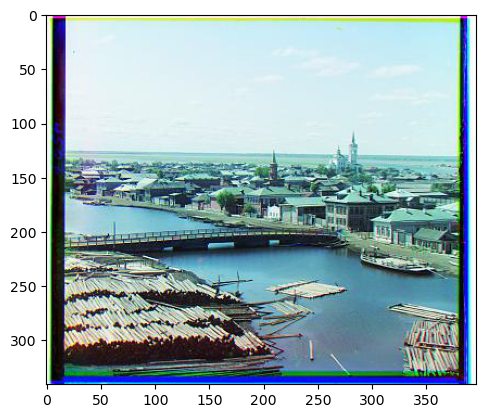

Showing image:  lugano_ncc.tif


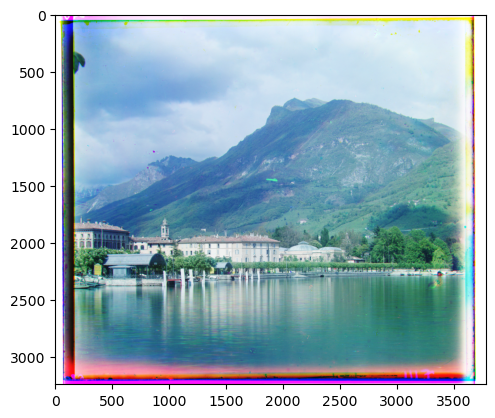

Showing image:  church_ncc.tif


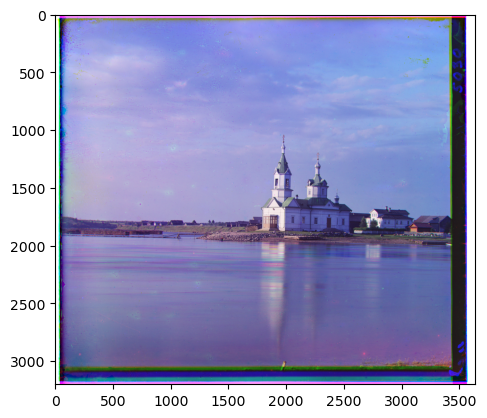

Showing image:  siren_ncc.tif


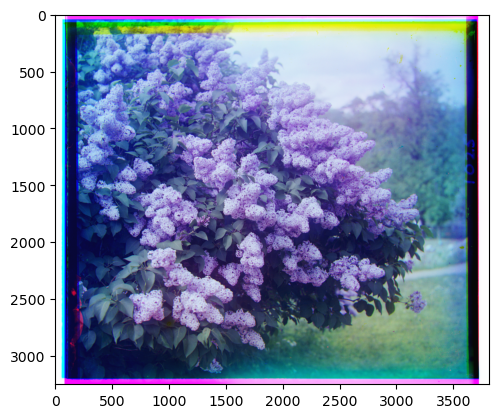

Showing image:  monastery_ncc.jpg


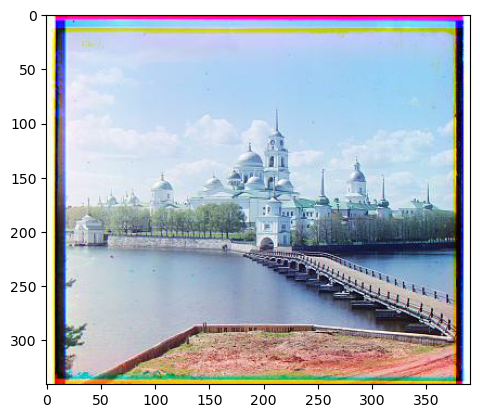

Showing image:  emir_ncc.tif


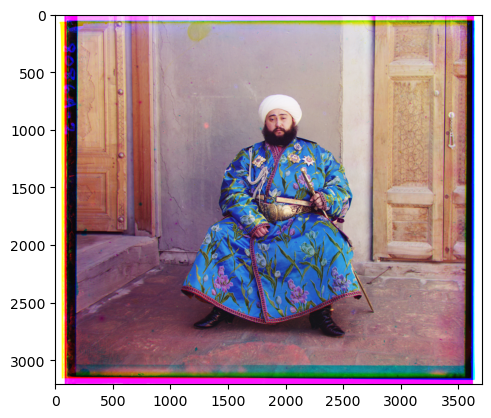

Showing image:  icon_ncc.tif


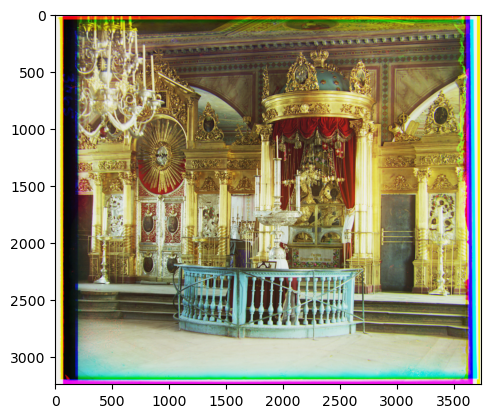

Showing image:  cathedral_ncc.jpg


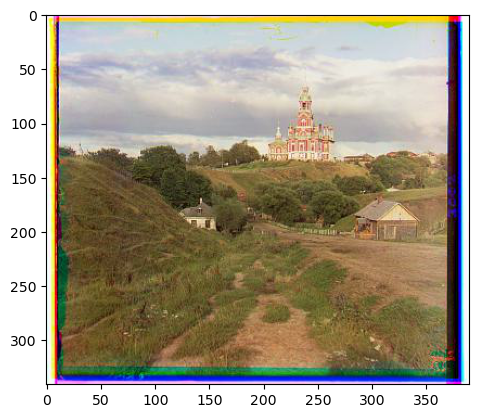

Showing image:  melons_ncc.tif


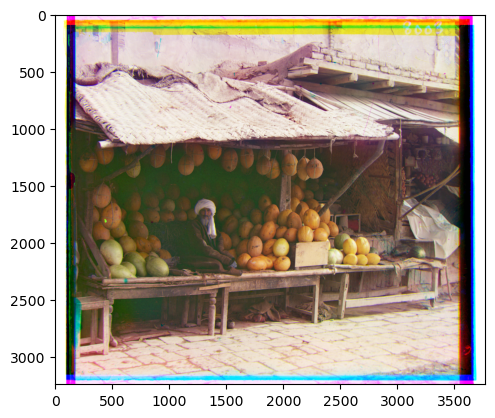

Showing image:  lastochikino_ncc.tif


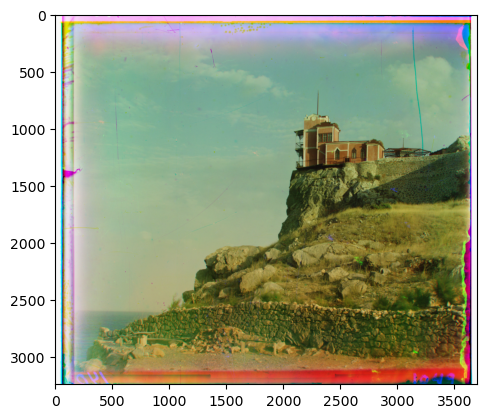

Showing image:  italil_ncc.tif


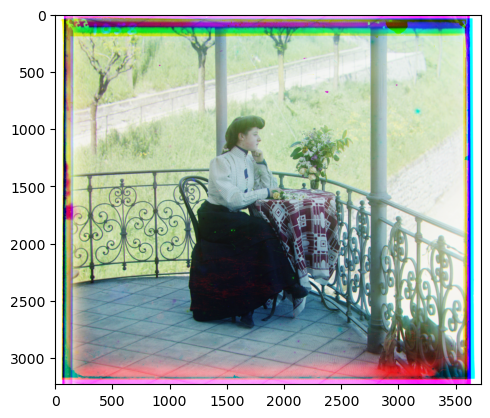

Showing image:  self_portrait_ncc.tif


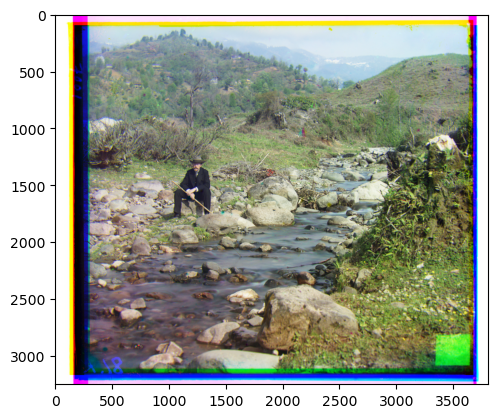

Showing image:  harvesters_ncc.tif


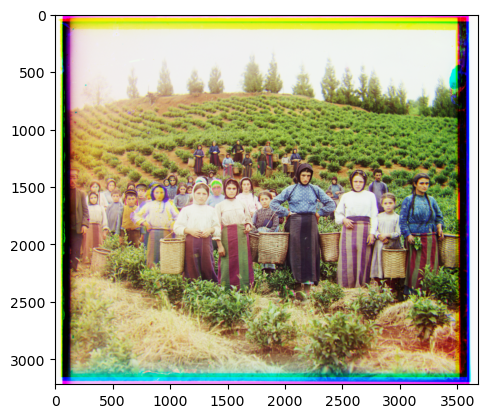

Showing image:  three_generations_ncc.tif


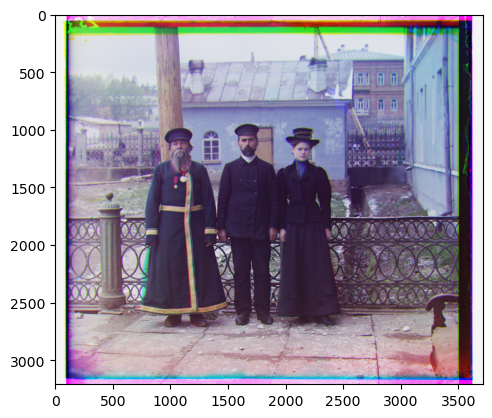

In [57]:
for file in os.listdir("image_results"):
    if "ncc" in file:
        print("Showing image: ", file)
        img = io.imread(os.path.join("image_results", file))
        plt.imshow(img)
        plt.show()

In [17]:
# get unaligned images for website comparison
for image in image_paths:
    print(f"Loaded image {image}")
    loaded_image = load_image(image)
    blue, green, red = split_channels(loaded_image)
    unaligned_image = np.dstack([red, green, blue])
    
    if unaligned_image.dtype == np.float64 or unaligned_image.dtype == np.float32:
        unaligned_image = np.clip(unaligned_image, 0, 1)
        unaligned_image = (unaligned_image * 255).astype(np.uint8)
    
    os.makedirs("unaligned_images", exist_ok=True)
    image_name = os.path.basename(image)
    output_path = os.path.join("unaligned_images", image_name)
    io.imsave(output_path, unaligned_image)
    print("-" * 30)


Loaded image proj_og_images/emir.tif
------------------------------
Loaded image proj_og_images/italil.tif
------------------------------
Loaded image proj_og_images/monastery.jpg
------------------------------
Loaded image proj_og_images/church.tif
------------------------------
Loaded image proj_og_images/three_generations.tif
------------------------------
Loaded image proj_og_images/lugano.tif
------------------------------
Loaded image proj_og_images/melons.tif
------------------------------
Loaded image proj_og_images/lastochikino.tif
------------------------------
Loaded image proj_og_images/tobolsk.jpg
------------------------------
Loaded image proj_og_images/icon.tif
------------------------------
Loaded image proj_og_images/cathedral.jpg
------------------------------
Loaded image proj_og_images/siren.tif
------------------------------
Loaded image proj_og_images/self_portrait.tif
------------------------------
Loaded image proj_og_images/harvesters.tif
---------------------

Loaded image emir.tif


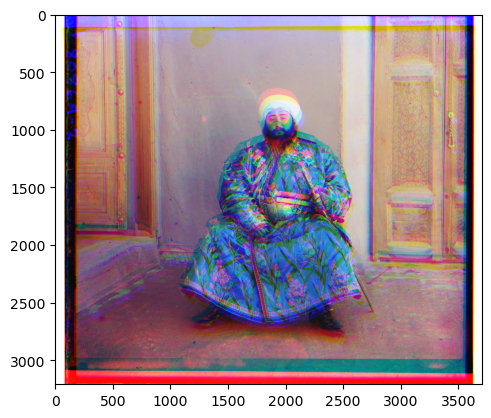

Loaded image italil.tif


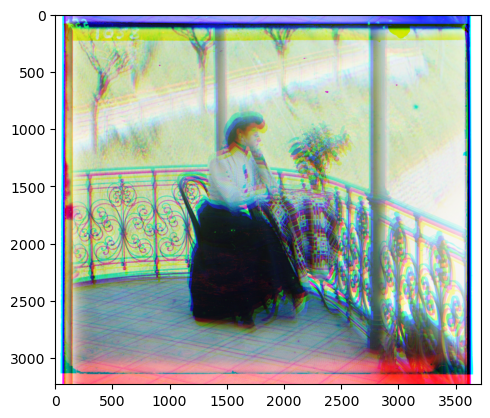

Loaded image monastery.jpg


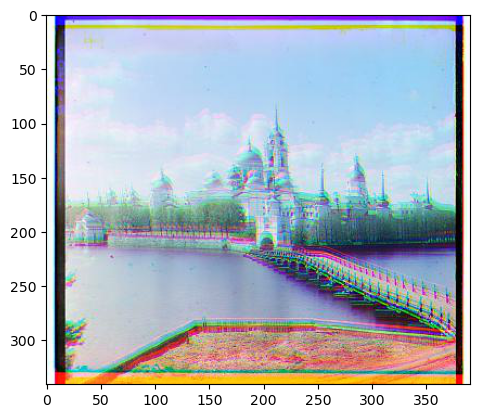

Loaded image church.tif


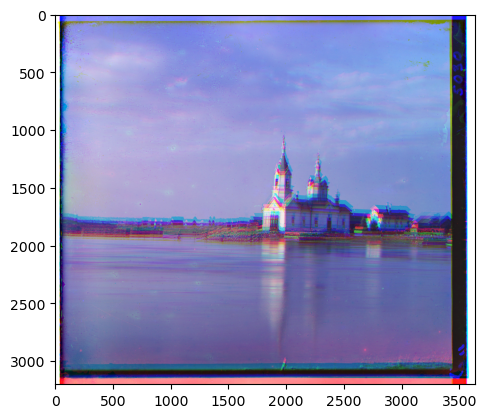

Loaded image three_generations.tif


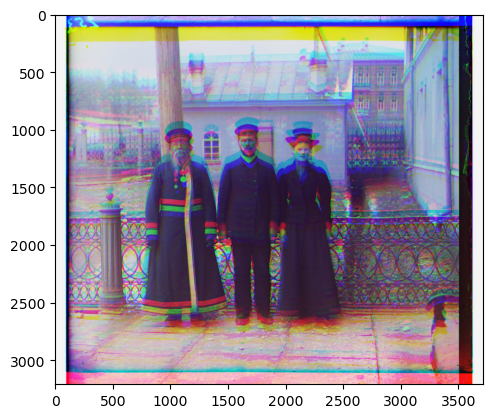

Loaded image lugano.tif


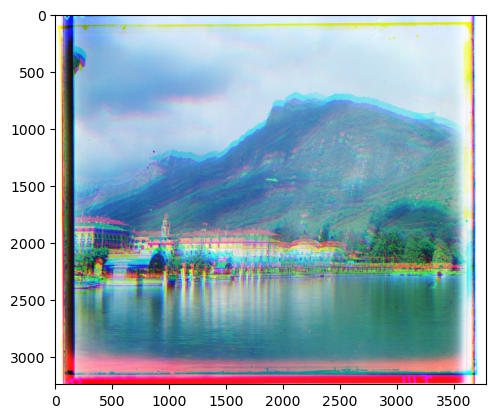

Loaded image melons.tif


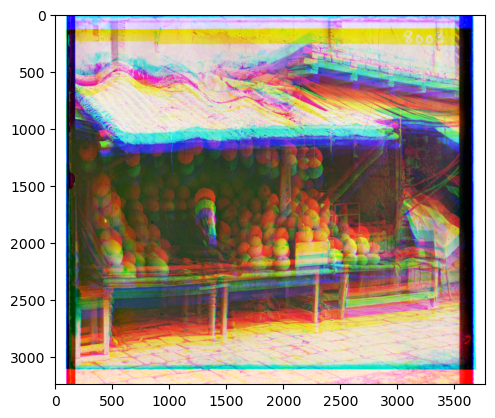

Loaded image lastochikino.tif


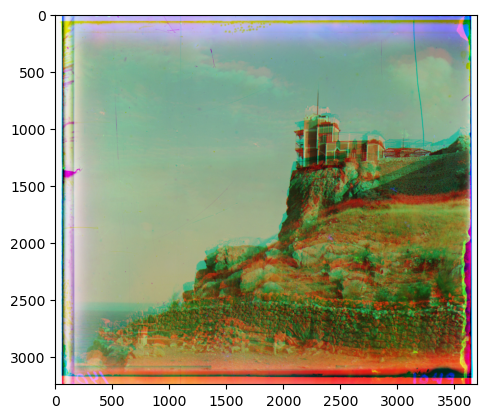

Loaded image tobolsk.jpg


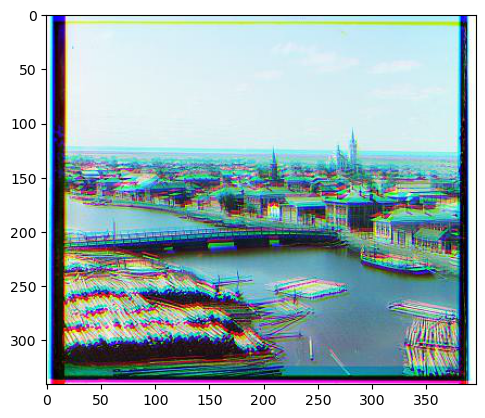

Loaded image icon.tif


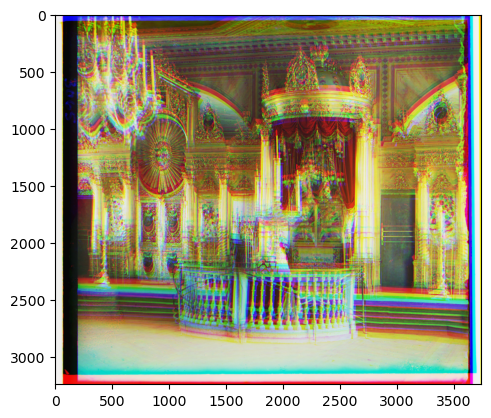

Loaded image cathedral.jpg


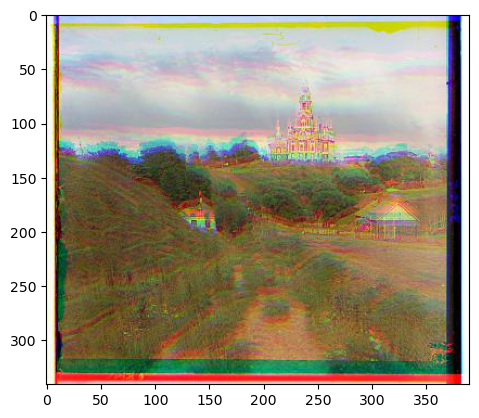

Loaded image siren.tif


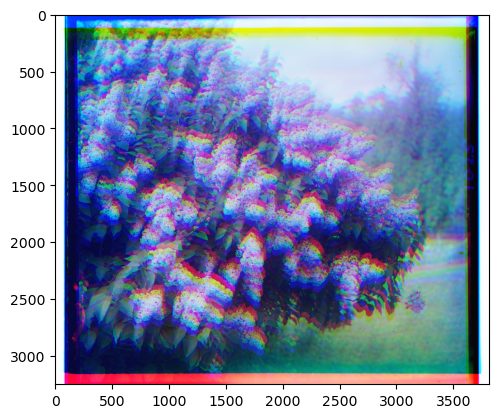

Loaded image self_portrait.tif


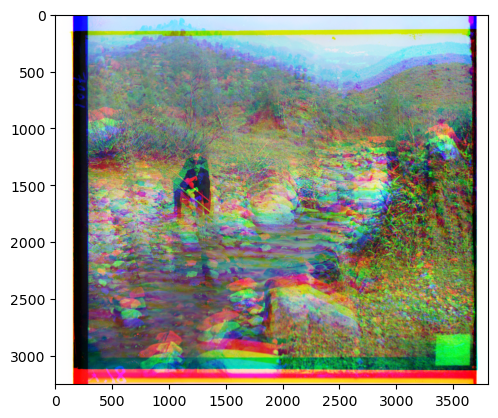

Loaded image harvesters.tif


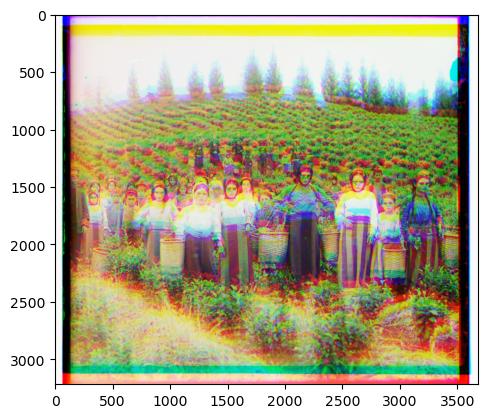

In [18]:
for image in os.listdir("unaligned_images"):
    print(f"Loaded image {image}")
    img = io.imread(os.path.join("unaligned_images", image))
    plt.imshow(img)
    plt.show()

In [59]:
for image in os.listdir("extra_negatives"):
    print(f"Loaded image {image}")
    loaded_image = load_image("extra_negatives/" + image)
    blue, green, red = split_channels(loaded_image)

    red_aligned, red_offset = pyramid_align(green, red, 'ncc')
    blue_aligned, blue_offset = pyramid_align(green, blue, 'ncc')
    print(f"Aligned channels, red_offset: {red_offset}, blue_offset: {blue_offset}")

    final_img = np.dstack([red_aligned, green, blue_aligned])
    if final_img.dtype == np.float64 or final_img.dtype == np.float32:
        final_img = np.clip(final_img, 0, 1)
        final_img = (final_img * 255).astype(np.uint8)
    
    os.makedirs("extra_image_results", exist_ok=True)
    image_name, image_type = os.path.basename(image).split(".")
    output_path = os.path.join("extra_image_results", image_name + "_ncc." + image_type)
    io.imsave(output_path, final_img)
    print(f"Saved aligned image to {output_path}")
    print("-" * 30)
    

Loaded image rubble_building.tif
Aligned channels, red_offset: (44, 1), blue_offset: (-26, -10)
Saved aligned image to extra_image_results/rubble_building_ncc.tif
------------------------------
Loaded image haystacks.tif
Aligned channels, red_offset: (71, -10), blue_offset: (-66, 6)
Saved aligned image to extra_image_results/haystacks_ncc.tif
------------------------------
Loaded image man_and_sacks.tif
Aligned channels, red_offset: (60, 7), blue_offset: (-56, -21)
Saved aligned image to extra_image_results/man_and_sacks_ncc.tif
------------------------------
Loaded image statue.tif
Aligned channels, red_offset: (120, 0), blue_offset: (-44, -2)
Saved aligned image to extra_image_results/statue_ncc.tif
------------------------------


Loaded image rubble_building_ncc.tif


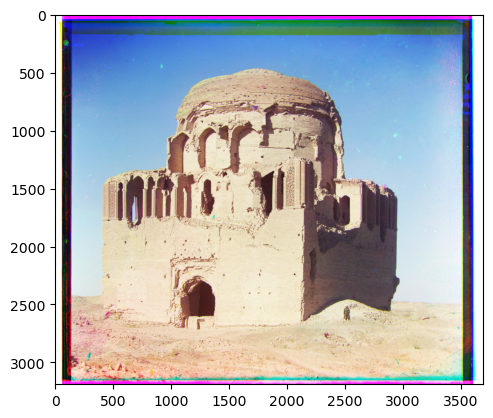

Loaded image haystacks_ncc.tif


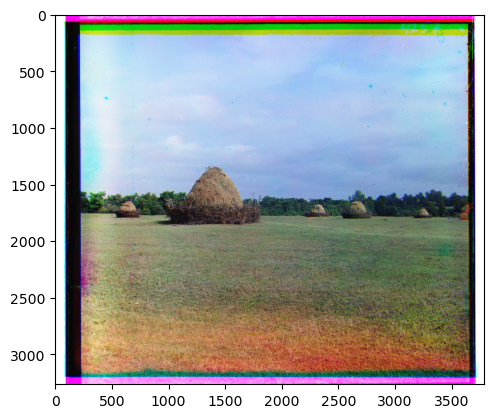

Loaded image man_and_sacks_ncc.tif


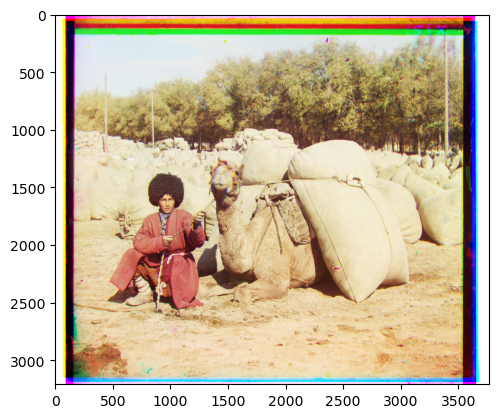

Loaded image statue_ncc.tif


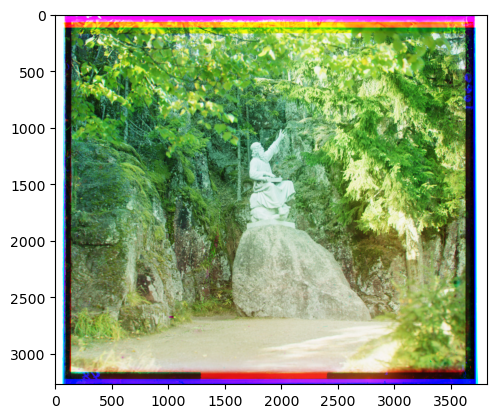

In [60]:
for image in os.listdir("extra_image_results"):
    print(f"Loaded image {image}")
    img = io.imread(os.path.join("extra_image_results", image))
    plt.imshow(img)
    plt.show()

In [63]:
for image in os.listdir("extra_negatives"):
    print(f"Loaded image {image}")
    loaded_image = load_image("extra_negatives/" + image)
    blue, green, red = split_channels(loaded_image)
    unaligned_image = np.dstack([red, green, blue])
    
    if unaligned_image.dtype == np.float64 or unaligned_image.dtype == np.float32:
        unaligned_image = np.clip(unaligned_image, 0, 1)
        unaligned_image = (unaligned_image * 255).astype(np.uint8)
    
    os.makedirs("unaligned_extra_images", exist_ok=True)
    image_name = os.path.basename(image)
    output_path = os.path.join("unaligned_extra_images", image_name)
    io.imsave(output_path, unaligned_image)
    print("-" * 30)
    


Loaded image rubble_building.tif
------------------------------
Loaded image haystacks.tif
------------------------------
Loaded image man_and_sacks.tif
------------------------------
Loaded image statue.tif
------------------------------
